In [1]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np

In [2]:
# Load your data as you were before
def load(file_path):
    df = pd.read_csv(file_path)
    m, s = df['tow'].mean(), df['tow'].std()
    df['date'] = pd.to_datetime(df['date'])
    df['actual_offblock_time'] = pd.to_datetime(df['actual_offblock_time'])
    df['arrival_time'] = pd.to_datetime(df['arrival_time'])
    df['offblock_hour'] = df['actual_offblock_time'].dt.round('h').dt.hour
    df['offblock_day_of_week'] = df['actual_offblock_time'].dt.dayofweek
    df['offblock_month'] = df['actual_offblock_time'].dt.month
    df = df.drop(columns=['flight_id','name_adep', 'callsign', 'actual_offblock_time', 'arrival_time', 'date'])
    df['tow'] = (df['tow'] - m) / s  # Standardize 'tow' column
    return df, m, s

# Load data
df, mean, std = load('challenge_set.csv')


In [3]:
# Separate features and target
X = df.drop('tow', axis=1)
y = df['tow']


In [4]:
X = df.drop('tow', axis=1)
y = df.tow

In [5]:
# Handle categorical columns with Label Encoding
categorical_columns = ['adep', 'country_code_adep', 'ades', 'name_ades', 
                       'country_code_ades', 'aircraft_type', 'wtc', 'airline']


In [6]:
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))  # Ensure all data is treated as string for encoding
    label_encoders[col] = le

In [7]:
# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.8, random_state=42)



In [8]:
from lightgbm import early_stopping, log_evaluation
from sklearn.metrics import r2_score, mean_squared_error
import optuna


# Define the objective function for Optuna
def objective(trial):
    # Suggest hyperparameters for LightGBM
    params = {
        'objective': 'regression',
        'metric': 'rmse',  # Use RMSE as the evaluation metric
        'random_state': 42,
        'n_estimators': 1_000_000,  # Set high to allow early stopping
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
#        'gamma': trial.suggest_float('gamma', 1e-3, 1.0, log=True),  # Gamma is "min_split_gain" in LightGBM
        'subsample': 1.0,
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-4, 1.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-4, 1.0, log=True),
        'n_jobs': -1  # Use all available cores
    }

    # Initialize the LightGBM regressor with the suggested parameters
    model = lgb.LGBMRegressor(**params)

    # Train the model with early stopping using callbacks
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric='rmse',  # Use RMSE for evaluation
        callbacks=[
            early_stopping(stopping_rounds=20),
            log_evaluation(period=100)  # Control verbosity here
        ]
    )
    
    # Make predictions and calculate the RMSE on the validation set
    preds = model.predict(X_val)
    rmse = np.sqrt(mean_squared_error(y_val, preds))
    
    return rmse

# Start the Optuna study to minimize RMSE
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

# Display the best hyperparameters found
print(f"Best trial: {study.best_trial.params}")

# Train the final model with the best parameters
best_params = study.best_trial.params
best_model = lgb.LGBMRegressor(
    **best_params,
    objective='regression',
    random_state=42,
    n_estimators=1_000_000,
    n_jobs=-1
)

# Train the best model with early stopping using callbacks
best_model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric='rmse',
    callbacks=[
        early_stopping(stopping_rounds=20),
        log_evaluation(period=100)
    ]
)

# Update the n_estimators parameter with the best number of iterations found
best_params['n_estimators'] = best_model.best_iteration_

# Evaluate the model on the test set
y_pred = best_model.predict(X)
r2 = r2_score(y, y_pred)
rmse = np.sqrt(mean_squared_error(y, y_pred))

print(f"Best Model Performance - R^2 Score: {r2:.4f}, RMSE: {rmse:.4f}")
print(f"Updated best_params: {best_params}")

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[I 2024-09-14 19:28:27,840] A new study created in memory with name: no-name-4abe8a6c-57df-4d91-ac9f-d061d2354a91


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001980 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.686017
[200]	valid_0's rmse: 0.477801
[300]	valid_0's rmse: 0.337262
[400]	valid_0's rmse: 0.243643
[500]	valid_0's rmse: 0.182602
[600]	valid_0's rmse: 0.144053
[700]	valid_0's rmse: 0.12043
[800]	valid_0's rmse: 0.106286
[900]	valid_0's rmse: 0.097945
[1000]	valid_0's rmse: 0.0929965
[1100]	valid_0's rmse: 0.0900687
[1200]	valid_0's rmse: 0.0882065
[1300]	valid_0's rmse: 0.0868626
[1400]	valid_0's rmse: 0.0858386
[1500]	valid_0's rmse: 0.0850258
[1600]	valid_0's rmse: 0.0842678
[1700]	valid_0's rmse: 

[I 2024-09-14 19:34:22,194] Trial 0 finished with value: 0.06617740853794749 and parameters: {'learning_rate': 0.0037850493873474297, 'max_depth': 8, 'min_child_weight': 8, 'colsample_bytree': 0.907456751727308, 'reg_alpha': 0.003221906896459757, 'reg_lambda': 0.0006827241891138515}. Best is trial 0 with value: 0.06617740853794749.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.096799
[200]	valid_0's rmse: 0.0826968
[300]	valid_0's rmse: 0.0789875
[400]	valid_0's rmse: 0.0766879
[500]	valid_0's rmse: 0.0750731
[600]	valid_0's rmse: 0.0740323
[700]	valid_0's rmse: 0.0731861
[800]	valid_0's rmse: 0.0725957
[900]	valid_0's rmse: 0.0721019
[1000]	valid_0's rmse: 0.0715509
[1100]	valid_0's rmse: 0.071106
[1200]	valid_0's rmse: 0.0707195
[1300]	valid_0's rmse: 0.0703752
[1400]	valid_0's rmse: 0.0700839
[1500]	valid_0's rmse: 0.0697956
[1600]	valid_0's rmse: 0.0695769
[1700]	valid_0'

[I 2024-09-14 19:35:05,851] Trial 1 finished with value: 0.06571366772160817 and parameters: {'learning_rate': 0.03433531814602972, 'max_depth': 13, 'min_child_weight': 5, 'colsample_bytree': 0.837770406440715, 'reg_alpha': 0.00013165631273012317, 'reg_lambda': 0.010452017552449734}. Best is trial 1 with value: 0.06571366772160817.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002196 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.886709
[200]	valid_0's rmse: 0.791859
[300]	valid_0's rmse: 0.707346
[400]	valid_0's rmse: 0.632371
[500]	valid_0's rmse: 0.565921
[600]	valid_0's rmse: 0.506792
[700]	valid_0's rmse: 0.454356
[800]	valid_0's rmse: 0.407877
[900]	valid_0's rmse: 0.366727
[1000]	valid_0's rmse: 0.330397
[1100]	valid_0's rmse: 0.298407
[1200]	valid_0's rmse: 0.270141
[1300]	valid_0's rmse: 0.245222
[1400]	valid_0's rmse: 0.223346
[1500]	valid_0's rmse: 0.204252
[1600]	valid_0's rmse: 0.187539
[1700]	valid_0's rmse: 0.1730

[I 2024-09-14 20:04:57,250] Trial 2 finished with value: 0.06588968854185578 and parameters: {'learning_rate': 0.0011605331666571601, 'max_depth': 12, 'min_child_weight': 6, 'colsample_bytree': 0.9148865815627599, 'reg_alpha': 0.0010019762701074402, 'reg_lambda': 0.9680400047603648}. Best is trial 1 with value: 0.06571366772160817.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002515 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's rmse: 0.46641
[200]	valid_0's rmse: 0.240042
[300]	valid_0's rmse: 0.153009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[I 2024-09-14 20:09:18,934] Trial 3 finished with value: 0.06712457925342226 and parameters: {'learning_rate': 0.009364783724864083, 'max_depth': 5, 'min_child_weight': 4, 'colsample_bytree': 0.4051463640282673, 'reg_alpha': 0.0014955898989576653, 'reg_lambda': 0.00013633629778803788}. Best is trial 1 with value: 0.06571366772160817.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.733648
[200]	valid_0's rmse: 0.545113
[300]	valid_0's rmse: 0.410097
[400]	valid_0's rmse: 0.314616
[500]	valid_0's rmse: 0.246864
[600]	valid_0's rmse: 0.198415
[700]	valid_0's rmse: 0.164911
[800]	valid_0's rmse: 0.141943
[900]	valid_0's rmse: 0.128159
[1000]	valid_0's rmse: 0.117256
[1100]	valid_0's rmse: 0.10978
[1200]	valid_0's rmse: 0.104557
[1300]	valid_0's rmse: 0.10073
[1400]	valid_0's rmse: 0.0975791
[1500]	valid_0's rmse: 0.0954841
[1600]	valid_0's rmse: 0.0935849
[1700]	valid_0's rmse: 0.092

[I 2024-09-14 20:21:58,778] Trial 4 finished with value: 0.06619977706251592 and parameters: {'learning_rate': 0.003448741156566414, 'max_depth': 6, 'min_child_weight': 8, 'colsample_bytree': 0.45158174231159576, 'reg_alpha': 0.0016686150647014536, 'reg_lambda': 0.002802717542220131}. Best is trial 1 with value: 0.06571366772160817.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.196193
[200]	valid_0's rmse: 0.0948033
[300]	valid_0's rmse: 0.0850606
[400]	valid_0's rmse: 0.0819652
[500]	valid_0's rmse: 0.079802
[600]	valid_0's rmse: 0.0782329
[700]	valid_0's rmse: 0.0770375
[800]	valid_0's rmse: 0.0760771
[900]	valid_0's rmse: 0.0752971
[1000]	valid_0's rmse: 0.074639
[1100]	valid_0's rmse: 0.074029
[1200]	valid_0's rmse: 0.0735218
[1300]	valid_0's rmse: 0.0730867
[1400]	valid_0's rmse: 0.0726532
[1500]	valid_0's rmse: 0.072328
[1600]	valid_0's rmse: 0.0720145
[1700]	valid_0's r

[I 2024-09-14 20:23:26,863] Trial 5 finished with value: 0.06542640859428583 and parameters: {'learning_rate': 0.018219732712896286, 'max_depth': 15, 'min_child_weight': 3, 'colsample_bytree': 0.652799005689106, 'reg_alpha': 0.0065556163810549, 'reg_lambda': 0.00015287973603679577}. Best is trial 5 with value: 0.06542640859428583.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0817301
[200]	valid_0's rmse: 0.0758901
[300]	valid_0's rmse: 0.0732117
[400]	valid_0's rmse: 0.0717553
[500]	valid_0's rmse: 0.0707447
[600]	valid_0's rmse: 0.0699461
[700]	valid_0's rmse: 0.0693441
[800]	valid_0's rmse: 0.0688653
[900]	valid_0's rmse: 0.0685366
[1000]	valid_0's rmse: 0.0681426
[1100]	valid_0's rmse: 0.0677866
[1200]	valid_0's rmse: 0.0675284
[1300]	valid_0's rmse: 0.0672958
[1400]	valid_0's rmse: 0.0670352
[1500]	valid_0's rmse: 0.0668271
[1600]	valid_0's rmse: 0.0666703
[1700]	valid_

[I 2024-09-14 20:23:55,111] Trial 6 finished with value: 0.06489710059306845 and parameters: {'learning_rate': 0.0745329296123027, 'max_depth': 15, 'min_child_weight': 4, 'colsample_bytree': 0.9185013259701474, 'reg_alpha': 0.14320505451601487, 'reg_lambda': 0.010952997421529834}. Best is trial 6 with value: 0.06489710059306845.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002090 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.117042
[200]	valid_0's rmse: 0.0848349
[300]	valid_0's rmse: 0.0807286
[400]	valid_0's rmse: 0.0781307
[500]	valid_0's rmse: 0.0764481
[600]	valid_0's rmse: 0.0752086
[700]	valid_0's rmse: 0.0742606
[800]	valid_0's rmse: 0.0734885
[900]	valid_0's rmse: 0.0728673
[1000]	valid_0's rmse: 0.0723527
[1100]	valid_0's rmse: 0.0718817
[1200]	valid_0's rmse: 0.0715151
[1300]	valid_0's rmse: 0.07111
[1400]	valid_0's rmse: 0.0707894
[1500]	valid_0's rmse: 0.0704829
[1600]	valid_0's rmse: 0.0702053
[1700]	valid_0's

[I 2024-09-14 20:25:05,129] Trial 7 finished with value: 0.06514635389075242 and parameters: {'learning_rate': 0.02739033960959498, 'max_depth': 14, 'min_child_weight': 5, 'colsample_bytree': 0.6371882609720794, 'reg_alpha': 0.002324701834328385, 'reg_lambda': 0.05575002541375315}. Best is trial 6 with value: 0.06489710059306845.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.377068
[200]	valid_0's rmse: 0.166462
[300]	valid_0's rmse: 0.105445
[400]	valid_0's rmse: 0.090474
[500]	valid_0's rmse: 0.0859811
[600]	valid_0's rmse: 0.0837791
[700]	valid_0's rmse: 0.0823055
[800]	valid_0's rmse: 0.08106
[900]	valid_0's rmse: 0.0799701
[1000]	valid_0's rmse: 0.0791276
[1100]	valid_0's rmse: 0.0783635
[1200]	valid_0's rmse: 0.0776972
[1300]	valid_0's rmse: 0.077127
[1400]	valid_0's rmse: 0.0765878
[1500]	valid_0's rmse: 0.0760781
[1600]	valid_0's rmse: 0.0756386
[1700]	valid_0's rms

[I 2024-09-14 20:30:24,214] Trial 8 finished with value: 0.06500940785769532 and parameters: {'learning_rate': 0.010209923175854082, 'max_depth': 14, 'min_child_weight': 1, 'colsample_bytree': 0.8144923699741426, 'reg_alpha': 0.0004029004128920257, 'reg_lambda': 0.0068466412694823415}. Best is trial 6 with value: 0.06489710059306845.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 20 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2024-09-14 20:38:00,783] Trial 9 finished with value: 0.07116680954800562 and parameters: {'learning_rate': 0.007216787496670031, 'max_depth': 3, 'min_child_weight': 7, 'colsample_bytree': 0.5149010009577019, 'reg_alpha': 0.25753254418523236, 'reg_lambda': 0.20302564213015623}. Best is trial 6 with value: 0.06489710059306845.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002360 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0810528
[200]	valid_0's rmse: 0.0753485
[300]	valid_0's rmse: 0.0728631
[400]	valid_0's rmse: 0.071565
[500]	valid_0's rmse: 0.0706044
[600]	valid_0's rmse: 0.0698231
[700]	valid_0's rmse: 0.0692157
[800]	valid_0's rmse: 0.0687824
[900]	valid_0's rmse: 0.0683741
[1000]	valid_0's rmse: 0.0680316
[1100]	valid_0's rmse: 0.0677445
[1200]	valid_0's rmse: 0.0674894
[1300]	valid_0's rmse: 0.0671993
[1400]	valid_0's rmse: 0.0669867
[1500]	valid_0's rmse: 0.0667945
[1600]	valid_0's rmse: 0.0666292
[1700]	valid_0

[I 2024-09-14 20:38:24,702] Trial 10 finished with value: 0.06507804669157922 and parameters: {'learning_rate': 0.08143907041047016, 'max_depth': 10, 'min_child_weight': 10, 'colsample_bytree': 0.9677194957733706, 'reg_alpha': 0.10911956584539084, 'reg_lambda': 0.04540032122098242}. Best is trial 6 with value: 0.06489710059306845.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.079309
[200]	valid_0's rmse: 0.0746054
[300]	valid_0's rmse: 0.0724581
[400]	valid_0's rmse: 0.071013
[500]	valid_0's rmse: 0.0701437
[600]	valid_0's rmse: 0.0694212
[700]	valid_0's rmse: 0.0688187
[800]	valid_0's rmse: 0.0683694
[900]	valid_0's rmse: 0.0679174
[1000]	valid_0's rmse: 0.0675779
[1100]	valid_0's rmse: 0.0672762
[1200]	valid_0's rmse: 0.0670203
[1300]	valid_0's rmse: 0.0668284
[1400]	valid_0's rmse: 0.0666348
[1500]	valid_0's rmse: 0.066488
[1600]	valid_0's rmse: 0.0663714
[1700]	valid_0's

[I 2024-09-14 20:38:43,666] Trial 11 finished with value: 0.06533029867863581 and parameters: {'learning_rate': 0.0993896098809199, 'max_depth': 11, 'min_child_weight': 1, 'colsample_bytree': 0.8240537891806731, 'reg_alpha': 0.03717486229425715, 'reg_lambda': 0.005644030320252043}. Best is trial 6 with value: 0.06489710059306845.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.086674
[200]	valid_0's rmse: 0.079608
[300]	valid_0's rmse: 0.0763736
[400]	valid_0's rmse: 0.0743443
[500]	valid_0's rmse: 0.0730446
[600]	valid_0's rmse: 0.0720807
[700]	valid_0's rmse: 0.0713336
[800]	valid_0's rmse: 0.0707171
[900]	valid_0's rmse: 0.070199
[1000]	valid_0's rmse: 0.0697704
[1100]	valid_0's rmse: 0.0694389
[1200]	valid_0's rmse: 0.0690986
[1300]	valid_0's rmse: 0.0688076
[1400]	valid_0's rmse: 0.0685792
[1500]	valid_0's rmse: 0.0683189
[1600]	valid_0's rmse: 0.0680739
[1700]	valid_0's

[I 2024-09-14 20:39:33,496] Trial 12 finished with value: 0.06464946115044289 and parameters: {'learning_rate': 0.05028689384817766, 'max_depth': 15, 'min_child_weight': 1, 'colsample_bytree': 0.7636045102527638, 'reg_alpha': 0.9674342935507586, 'reg_lambda': 0.001550798786924796}. Best is trial 12 with value: 0.06464946115044289.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002042 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0865621
[200]	valid_0's rmse: 0.0793057
[300]	valid_0's rmse: 0.0762013
[400]	valid_0's rmse: 0.0742143
[500]	valid_0's rmse: 0.0729603
[600]	valid_0's rmse: 0.0720755
[700]	valid_0's rmse: 0.0713458
[800]	valid_0's rmse: 0.070717
[900]	valid_0's rmse: 0.0702037
[1000]	valid_0's rmse: 0.0697978
[1100]	valid_0's rmse: 0.0694091
[1200]	valid_0's rmse: 0.0690858
[1300]	valid_0's rmse: 0.0688057
[1400]	valid_0's rmse: 0.0685453
[1500]	valid_0's rmse: 0.0683025
[1600]	valid_0's rmse: 0.0680617
[1700]	valid_0

[I 2024-09-14 20:40:23,094] Trial 13 finished with value: 0.06462265853475532 and parameters: {'learning_rate': 0.04993234588636218, 'max_depth': 15, 'min_child_weight': 3, 'colsample_bytree': 0.7639174156773779, 'reg_alpha': 0.48743697540010555, 'reg_lambda': 0.001177259560005783}. Best is trial 13 with value: 0.06462265853475532.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002032 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0892481
[200]	valid_0's rmse: 0.0805214
[300]	valid_0's rmse: 0.0773026
[400]	valid_0's rmse: 0.0754195
[500]	valid_0's rmse: 0.0740865
[600]	valid_0's rmse: 0.0730788
[700]	valid_0's rmse: 0.072311
[800]	valid_0's rmse: 0.0715942
[900]	valid_0's rmse: 0.071066
[1000]	valid_0's rmse: 0.0705876
[1100]	valid_0's rmse: 0.0702138
[1200]	valid_0's rmse: 0.0698339
[1300]	valid_0's rmse: 0.069536
[1400]	valid_0's rmse: 0.0692449
[1500]	valid_0's rmse: 0.0689613
[1600]	valid_0's rmse: 0.0687141
[1700]	valid_0's

[I 2024-09-14 20:41:33,790] Trial 14 finished with value: 0.0644228467905732 and parameters: {'learning_rate': 0.04213891931260533, 'max_depth': 9, 'min_child_weight': 2, 'colsample_bytree': 0.7396015813479618, 'reg_alpha': 0.8448497187208006, 'reg_lambda': 0.00102806743661447}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001830 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.153194
[200]	valid_0's rmse: 0.0888643
[300]	valid_0's rmse: 0.0831881
[400]	valid_0's rmse: 0.0804836
[500]	valid_0's rmse: 0.0785854
[600]	valid_0's rmse: 0.0772141
[700]	valid_0's rmse: 0.0760895
[800]	valid_0's rmse: 0.0751862
[900]	valid_0's rmse: 0.0744735
[1000]	valid_0's rmse: 0.073881
[1100]	valid_0's rmse: 0.073384
[1200]	valid_0's rmse: 0.0729469
[1300]	valid_0's rmse: 0.0725086
[1400]	valid_0's rmse: 0.0721064
[1500]	valid_0's rmse: 0.0717912
[1600]	valid_0's rmse: 0.0714771
[1700]	valid_0's

[I 2024-09-14 20:44:03,480] Trial 15 finished with value: 0.06445538031654548 and parameters: {'learning_rate': 0.021788076986748478, 'max_depth': 9, 'min_child_weight': 3, 'colsample_bytree': 0.7155937575937078, 'reg_alpha': 0.9122200033186563, 'reg_lambda': 0.0005532902647904274}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002305 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.198929
[200]	valid_0's rmse: 0.0968928
[300]	valid_0's rmse: 0.0860297
[400]	valid_0's rmse: 0.0828192
[500]	valid_0's rmse: 0.0805666
[600]	valid_0's rmse: 0.0789396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[700]	valid_0's rmse: 0.0776691
[800]	valid_0's rmse: 0.0766447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[900]	valid_0's rmse: 0.075876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2024-09-14 20:46:14,455] Trial 16 finished with value: 0.06512622552634723 and parameters: {'learning_rate': 0.01854747421552087, 'max_depth': 8, 'min_child_weight': 2, 'colsample_bytree': 0.5577631619034649, 'reg_alpha': 0.040935115016213434, 'reg_lambda': 0.0005118336342353922}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.194839
[200]	valid_0's rmse: 0.0944983
[300]	valid_0's rmse: 0.0849528
[400]	valid_0's rmse: 0.0820479
[500]	valid_0's rmse: 0.0799825
[600]	valid_0's rmse: 0.0785123
[700]	valid_0's rmse: 0.0773489
[800]	valid_0's rmse: 0.0763521
[900]	valid_0's rmse: 0.0755459
[1000]	valid_0's rmse: 0.0748668
[1100]	valid_0's rmse: 0.0742897
[1200]	valid_0's rmse: 0.0738069
[1300]	valid_0's rmse: 0.0733966
[1400]	valid_0's rmse: 0.0730489
[1500]	valid_0's rmse: 0.072669
[1600]	valid_0's rmse: 0.0723657
[1700]	valid_0'

[I 2024-09-14 20:48:08,987] Trial 17 finished with value: 0.06503632204523249 and parameters: {'learning_rate': 0.018192190882669167, 'max_depth': 9, 'min_child_weight': 3, 'colsample_bytree': 0.7128818214743025, 'reg_alpha': 0.026070378847744376, 'reg_lambda': 0.00042688735374869704}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.105841
[200]	valid_0's rmse: 0.0858865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's rmse: 0.0813161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2024-09-14 20:49:40,822] Trial 18 finished with value: 0.0653062247884312 and parameters: {'learning_rate': 0.0330589074099193, 'max_depth': 6, 'min_child_weight': 2, 'colsample_bytree': 0.5864678461119277, 'reg_alpha': 0.9260650991691689, 'reg_lambda': 0.0002536569408161417}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.603936
[200]	valid_0's rmse: 0.373064
[300]	valid_0's rmse: 0.239422
[400]	valid_0's rmse: 0.163929
[500]	valid_0's rmse: 0.124322
[600]	valid_0's rmse: 0.104205
[700]	valid_0's rmse: 0.0946952
[800]	valid_0's rmse: 0.0900224
[900]	valid_0's rmse: 0.0874439
[1000]	valid_0's rmse: 0.0856916
[1100]	valid_0's rmse: 0.0844545
[1200]	valid_0's rmse: 0.0834455
[1300]	valid_0's rmse: 0.0826379
[1400]	valid_0's rmse: 0.0819551
[1500]	valid_0's rmse: 0.0813033
[1600]	valid_0's rmse: 0.0807141
[1700]	valid_0's rm

[I 2024-09-14 20:57:07,097] Trial 19 finished with value: 0.06486639640308509 and parameters: {'learning_rate': 0.005205188290820543, 'max_depth': 10, 'min_child_weight': 4, 'colsample_bytree': 0.6979741307326768, 'reg_alpha': 0.2805099897789256, 'reg_lambda': 0.002153862760076477}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003200 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.299629
[200]	valid_0's rmse: 0.125707
[300]	valid_0's rmse: 0.0925222
[400]	valid_0's rmse: 0.0860753
[500]	valid_0's rmse: 0.0835406
[600]	valid_0's rmse: 0.0818964
[700]	valid_0's rmse: 0.080489
[800]	valid_0's rmse: 0.0793353
[900]	valid_0's rmse: 0.0784616
[1000]	valid_0's rmse: 0.0776407
[1100]	valid_0's rmse: 0.0769924
[1200]	valid_0's rmse: 0.0764024
[1300]	valid_0's rmse: 0.0758676
[1400]	valid_0's rmse: 0.0753485
[1500]	valid_0's rmse: 0.0749056
[1600]	valid_0's rmse: 0.0744872
[1700]	valid_0's

[I 2024-09-14 21:00:11,243] Trial 20 finished with value: 0.06516058985068086 and parameters: {'learning_rate': 0.01278097157106876, 'max_depth': 8, 'min_child_weight': 2, 'colsample_bytree': 0.7518012952286786, 'reg_alpha': 0.07732896557419684, 'reg_lambda': 0.0006497916532484944}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.085621
[200]	valid_0's rmse: 0.0786981
[300]	valid_0's rmse: 0.075526
[400]	valid_0's rmse: 0.0738191
[500]	valid_0's rmse: 0.0727197
[600]	valid_0's rmse: 0.0717906
[700]	valid_0's rmse: 0.0710319
[800]	valid_0's rmse: 0.0704412
[900]	valid_0's rmse: 0.0699089
[1000]	valid_0's rmse: 0.0694932
[1100]	valid_0's rmse: 0.0691451
[1200]	valid_0's rmse: 0.0687845
[1300]	valid_0's rmse: 0.0684927
[1400]	valid_0's rmse: 0.0682168
[1500]	valid_0's rmse: 0.0679792
[1600]	valid_0's rmse: 0.0677856
[1700]	valid_0'

[I 2024-09-14 21:00:59,898] Trial 21 finished with value: 0.06470608316996278 and parameters: {'learning_rate': 0.053513434721886514, 'max_depth': 11, 'min_child_weight': 3, 'colsample_bytree': 0.7693736648836568, 'reg_alpha': 0.43510373077291326, 'reg_lambda': 0.0022220414789505634}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0893037
[200]	valid_0's rmse: 0.0808138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's rm

[I 2024-09-14 21:01:56,394] Trial 22 finished with value: 0.06502162977962354 and parameters: {'learning_rate': 0.04466347673357607, 'max_depth': 7, 'min_child_weight': 3, 'colsample_bytree': 0.667677426586172, 'reg_alpha': 0.46754906802655954, 'reg_lambda': 0.0011060591248637157}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002162 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.117777
[200]	valid_0's rmse: 0.0851768
[300]	valid_0's rmse: 0.0810404
[400]	valid_0's rmse: 0.0785239
[500]	valid_0's rmse: 0.076742
[600]	valid_0's rmse: 0.075512
[700]	valid_0's rmse: 0.0745654
[800]	valid_0's rmse: 0.0737232
[900]	valid_0's rmse: 0.0730547
[1000]	valid_0's rmse: 0.0724774
[1100]	valid_0's rmse: 0.0720137
[1200]	valid_0's rmse: 0.0716208
[1300]	valid_0's rmse: 0.0712417
[1400]	valid_0's rmse: 0.0709397
[1500]	valid_0's rmse: 0.0706343
[1600]	valid_0's rmse: 0.0703461
[1700]	valid_0's

[I 2024-09-14 21:03:49,703] Trial 23 finished with value: 0.06444326232968302 and parameters: {'learning_rate': 0.027089906255785546, 'max_depth': 10, 'min_child_weight': 2, 'colsample_bytree': 0.721615800290223, 'reg_alpha': 0.9568617659969376, 'reg_lambda': 0.00026380414005906485}. Best is trial 14 with value: 0.0644228467905732.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002577 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.141258
[200]	valid_0's rmse: 0.0883082
[300]	valid_0's rmse: 0.082901
[400]	valid_0's rmse: 0.0800998
[500]	valid_0's rmse: 0.078126
[600]	valid_0's rmse: 0.0766708
[700]	valid_0's rmse: 0.0755429
[800]	valid_0's rmse: 0.0746735
[900]	valid_0's rmse: 0.0739155
[1000]	valid_0's rmse: 0.0733083
[1100]	valid_0's rmse: 0.0727781
[1200]	valid_0's rmse: 0.0723826
[1300]	valid_0's rmse: 0.0720242
[1400]	valid_0's rmse: 0.0716793
[1500]	valid_0's rmse: 0.0713415
[1600]	valid_0's rmse: 0.0710632
[1700]	valid_0's

[I 2024-09-14 21:06:51,234] Trial 24 finished with value: 0.0643418962821722 and parameters: {'learning_rate': 0.024091470280522668, 'max_depth': 10, 'min_child_weight': 2, 'colsample_bytree': 0.5977502684727587, 'reg_alpha': 0.9498577823692379, 'reg_lambda': 0.00010903191730319565}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.113303
[200]	valid_0's rmse: 0.0844271
[300]	valid_0's rmse: 0.0803966
[400]	valid_0's rmse: 0.0779254
[500]	valid_0's rmse: 0.076281
[600]	valid_0's rmse: 0.0750599
[700]	valid_0's rmse: 0.0740546
[800]	valid_0's rmse: 0.0733012
[900]	valid_0's rmse: 0.0727028
[1000]	valid_0's rmse: 0.0722247
[1100]	valid_0's rmse: 0.0718144
[1200]	valid_0's rmse: 0.0714024
[1300]	valid_0's rmse: 0.0710454
[1400]	valid_0's rmse: 0.0707118
[1500]	valid_0's rmse: 0.0704081
[1600]	valid_0's rmse: 0.0701073
[1700]	valid_0'

[I 2024-09-14 21:08:21,348] Trial 25 finished with value: 0.0647634889817923 and parameters: {'learning_rate': 0.028316928316242836, 'max_depth': 11, 'min_child_weight': 2, 'colsample_bytree': 0.6153811466102158, 'reg_alpha': 0.186042523856701, 'reg_lambda': 0.00010380772104866503}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.305922
[200]	valid_0's rmse: 0.129699
[300]	valid_0's rmse: 0.0946874
[400]	valid_0's rmse: 0.0870652
[500]	valid_0's rmse: 0.0840668
[600]	valid_0's rmse: 0.0820739
[700]	valid_0's rmse: 0.0805743
[800]	valid_0's rmse: 0.0793437
[900]	valid_0's rmse: 0.0782862
[1000]	valid_0's rmse: 0.0773968
[1100]	valid_0's rmse: 0.0766651
[1200]	valid_0's rmse: 0.0760128
[1300]	valid_0's rmse: 0.0754791
[1400]	valid_0's rmse: 0.0750514
[1500]	valid_0's rmse: 0.0746497
[1600]	valid_0's rmse: 0.0742517
[1700]	valid_0'

[I 2024-09-14 21:11:26,622] Trial 26 finished with value: 0.06499750704813917 and parameters: {'learning_rate': 0.013033052338739245, 'max_depth': 10, 'min_child_weight': 1, 'colsample_bytree': 0.5368398773519542, 'reg_alpha': 0.07362569613998966, 'reg_lambda': 0.0002402322166241234}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002525 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0970077
[200]	valid_0's rmse: 0.0826779
[300]	valid_0's rmse: 0.0788565
[400]	valid_0's rmse: 0.0764669
[500]	valid_0's rmse: 0.0748918
[600]	valid_0's rmse: 0.0737772
[700]	valid_0's rmse: 0.0729628
[800]	valid_0's rmse: 0.0722951
[900]	valid_0's rmse: 0.0717364
[1000]	valid_0's rmse: 0.0712362
[1100]	valid_0's rmse: 0.0707583
[1200]	valid_0's rmse: 0.0703793
[1300]	valid_0's rmse: 0.0700332
[1400]	valid_0's rmse: 0.0696833
[1500]	valid_0's rmse: 0.0693951
[1600]	valid_0's rmse: 0.0691628
[1700]	valid_

[I 2024-09-14 21:12:35,206] Trial 27 finished with value: 0.06499318242439635 and parameters: {'learning_rate': 0.03951851468911107, 'max_depth': 13, 'min_child_weight': 2, 'colsample_bytree': 0.4747168203986142, 'reg_alpha': 0.010969115699842224, 'reg_lambda': 0.0002700127156747845}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002075 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0842545
[200]	valid_0's rmse: 0.0776117
[300]	valid_0's rmse: 0.0746119
[400]	valid_0's rmse: 0.0729623
[500]	valid_0's rmse: 0.0717683
[600]	valid_0's rmse: 0.0709059
[700]	valid_0's rmse: 0.0702805
[800]	valid_0's rmse: 0.0697223
[900]	valid_0's rmse: 0.0692598
[1000]	valid_0's rmse: 0.0688337
[1100]	valid_0's rmse: 0.068487
[1200]	valid_0's rmse: 0.0682223
[1300]	valid_0's rmse: 0.0679571
[1400]	valid_0's rmse: 0.0677061
[1500]	valid_0's rmse: 0.0674509
[1600]	valid_0's rmse: 0.0672899
[1700]	valid_0

[I 2024-09-14 21:13:12,800] Trial 28 finished with value: 0.06484930290265402 and parameters: {'learning_rate': 0.0693960993153706, 'max_depth': 9, 'min_child_weight': 4, 'colsample_bytree': 0.6024594790419298, 'reg_alpha': 0.48668729330540444, 'reg_lambda': 0.00024749891276443356}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002630 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.130075
[200]	valid_0's rmse: 0.0871737
[300]	valid_0's rmse: 0.0826784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[I 2024-09-14 21:14:22,379] Trial 29 finished with value: 0.06608769721999432 and parameters: {'learning_rate': 0.0246621223608964, 'max_depth': 7, 'min_child_weight': 10, 'colsample_bytree': 0.8635943929740528, 'reg_alpha': 0.2817966812351411, 'reg_lambda': 0.00010592309642665835}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.263759
[200]	valid_0's rmse: 0.111521
[300]	valid_0's rmse: 0.0890207
[400]	valid_0's rmse: 0.08427
[500]	valid_0's rmse: 0.0820466
[600]	valid_0's rmse: 0.0803498
[700]	valid_0's rmse: 0.0790292
[800]	valid_0's rmse: 0.0779818
[900]	valid_0's rmse: 0.0770996
[1000]	valid_0's rmse: 0.0763128
[1100]	valid_0's rmse: 0.0756784
[1200]	valid_0's rmse: 0.075097
[1300]	valid_0's rmse: 0.0745567
[1400]	valid_0's rmse: 0.0741009
[1500]	valid_0's rmse: 0.073669
[1600]	valid_0's rmse: 0.0733176
[1700]	valid_0's rm

[I 2024-09-14 21:16:32,030] Trial 30 finished with value: 0.06539386629185306 and parameters: {'learning_rate': 0.014360894630985988, 'max_depth': 12, 'min_child_weight': 6, 'colsample_bytree': 0.6806040815489732, 'reg_alpha': 0.009983540981061016, 'reg_lambda': 0.0009321595917835844}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.164153
[200]	valid_0's rmse: 0.0901419
[300]	valid_0's rmse: 0.0836721
[400]	valid_0's rmse: 0.0809232
[500]	valid_0's rmse: 0.0790222
[600]	valid_0's rmse: 0.0776025
[700]	valid_0's rmse: 0.0764596
[800]	valid_0's rmse: 0.0755362
[900]	valid_0's rmse: 0.0747555
[1000]	valid_0's rmse: 0.0740962
[1100]	valid_0's rmse: 0.0735445
[1200]	valid_0's rmse: 0.0730783
[1300]	valid_0's rmse: 0.0726887
[1400]	valid_0's rmse: 0.0723486
[1500]	valid_0's rmse: 0.0719953
[1600]	valid_0's rmse: 0.071653
[1700]	valid_0'

[I 2024-09-14 21:19:04,353] Trial 31 finished with value: 0.06451450801676346 and parameters: {'learning_rate': 0.020690872732086966, 'max_depth': 9, 'min_child_weight': 2, 'colsample_bytree': 0.7188947417979689, 'reg_alpha': 0.8276554991970989, 'reg_lambda': 0.0003916288250022756}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002514 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0959093
[200]	valid_0's rmse: 0.0821451
[300]	valid_0's rmse: 0.0785393
[400]	valid_0's rmse: 0.0764282
[500]	valid_0's rmse: 0.0748739
[600]	valid_0's rmse: 0.0737806
[700]	valid_0's rmse: 0.0729298
[800]	valid_0's rmse: 0.072262
[900]	valid_0's rmse: 0.0716489
[1000]	valid_0's rmse: 0.0712265
[1100]	valid_0's rmse: 0.070815
[1200]	valid_0's rmse: 0.0704625
[1300]	valid_0's rmse: 0.0701285
[1400]	valid_0's rmse: 0.0698146
[1500]	valid_0's rmse: 0.0695236
[1600]	valid_0's rmse: 0.0692679
[1700]	valid_0'

[I 2024-09-14 21:20:11,140] Trial 32 finished with value: 0.06466119319631564 and parameters: {'learning_rate': 0.0349781836974139, 'max_depth': 10, 'min_child_weight': 1, 'colsample_bytree': 0.7267499970516357, 'reg_alpha': 0.6463132121601743, 'reg_lambda': 0.0006236454396446519}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002378 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.901474
[200]	valid_0's rmse: 0.818072
[300]	valid_0's rmse: 0.74267
[400]	valid_0's rmse: 0.674397
[500]	valid_0's rmse: 0.613129
[600]	valid_0's rmse: 0.557359
[700]	valid_0's rmse: 0.506969
[800]	valid_0's rmse: 0.461475
[900]	valid_0's rmse: 0.420815
[1000]	valid_0's rmse: 0.38413
[1100]	valid_0's rmse: 0.351064
[1200]	valid_0's rmse: 0.321123
[1300]	valid_0's rmse: 0.29434
[1400]	valid_0's rmse: 0.270233
[1500]	valid_0's rmse: 0.248693
[1600]	valid_0's rmse: 0.229249
[1700]	valid_0's rmse: 0.212024


[I 2024-09-14 21:56:18,887] Trial 33 finished with value: 0.06557387621079006 and parameters: {'learning_rate': 0.0010059085109670302, 'max_depth': 8, 'min_child_weight': 3, 'colsample_bytree': 0.7892297715016423, 'reg_alpha': 0.3147948110523973, 'reg_lambda': 0.00351774963244063}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001824 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.817623
[200]	valid_0's rmse: 0.673561
[300]	valid_0's rmse: 0.557703
[400]	valid_0's rmse: 0.462424
[500]	valid_0's rmse: 0.385779
[600]	valid_0's rmse: 0.322575
[700]	valid_0's rmse: 0.271538
[800]	valid_0's rmse: 0.230333
[900]	valid_0's rmse: 0.197957
[1000]	valid_0's rmse: 0.172207
[1100]	valid_0's rmse: 0.152061
[1200]	valid_0's rmse: 0.135967
[1300]	valid_0's rmse: 0.123798
[1400]	valid_0's rmse: 0.114485
[1500]	valid_0's rmse: 0.107644
[1600]	valid_0's rmse: 0.102367
[1700]	valid_0's rmse: 0.0984

[I 2024-09-14 22:24:10,552] Trial 34 finished with value: 0.06465627314127956 and parameters: {'learning_rate': 0.002043455604784032, 'max_depth': 12, 'min_child_weight': 2, 'colsample_bytree': 0.6439812968471865, 'reg_alpha': 0.9733859478230799, 'reg_lambda': 0.00018404232183242842}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002908 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.152352
[200]	valid_0's rmse: 0.0891098
[300]	valid_0's rmse: 0.083705
[400]	valid_0's rmse: 0.0809855
[500]	valid_0's rmse: 0.0791069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[600]	valid_0's rmse: 0.0778555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[700]	valid_0's rmse: 0.0767799
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[I 2024-09-14 22:25:46,163] Trial 35 finished with value: 0.0654841667724551 and parameters: {'learning_rate': 0.021671677422756382, 'max_depth': 7, 'min_child_weight': 4, 'colsample_bytree': 0.8492411931578183, 'reg_alpha': 0.1865955181320744, 'reg_lambda': 0.022410644178745862}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002078 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.453726
[200]	valid_0's rmse: 0.223831
[300]	valid_0's rmse: 0.133252
[400]	valid_0's rmse: 0.102239
[500]	valid_0's rmse: 0.0920035
[600]	valid_0's rmse: 0.0874736
[700]	valid_0's rmse: 0.0851484
[800]	valid_0's rmse: 0.0835898
[900]	valid_0's rmse: 0.0823563
[1000]	valid_0's rmse: 0.0812497
[1100]	valid_0's rmse: 0.0803316
[1200]	valid_0's rmse: 0.0795372
[1300]	valid_0's rmse: 0.07877
[1400]	valid_0's rmse: 0.0781117
[1500]	valid_0's rmse: 0.0775322
[1600]	valid_0's rmse: 0.0770231
[1700]	valid_0's rm

[I 2024-09-14 22:54:58,004] Trial 36 finished with value: 0.06507959129231038 and parameters: {'learning_rate': 0.008504300379605865, 'max_depth': 11, 'min_child_weight': 1, 'colsample_bytree': 0.5734779496171033, 'reg_alpha': 0.00027771256312903906, 'reg_lambda': 0.000408765702055414}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0837227
[200]	valid_0's rmse: 0.0775891
[300]	valid_0's rmse: 0.074768
[400]	valid_0's rmse: 0.0731045
[500]	valid_0's rmse: 0.0719145
[600]	valid_0's rmse: 0.0711427
[700]	valid_0's rmse: 0.0704698
[800]	valid_0's rmse: 0.0698736
[900]	valid_0's rmse: 0.0693927
[1000]	valid_0's rmse: 0.0690526
[1100]	valid_0's rmse: 0.0687093
[1200]	valid_0's rmse: 0.0683845
[1300]	valid_0's rmse: 0.0681147
[1400]	valid_0's rmse: 0.0678277
[1500]	valid_0's rmse: 0.0676166
[1600]	valid_0's rmse: 0.067392
[1700]	valid_0'

[I 2024-09-14 22:55:25,342] Trial 37 finished with value: 0.06495461144265878 and parameters: {'learning_rate': 0.06260827677483966, 'max_depth': 9, 'min_child_weight': 5, 'colsample_bytree': 0.7349875918312723, 'reg_alpha': 0.5516757621755717, 'reg_lambda': 0.0001503151000292002}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.104023
[200]	valid_0's rmse: 0.0833129
[300]	valid_0's rmse: 0.0795512
[400]	valid_0's rmse: 0.0771583
[500]	valid_0's rmse: 0.0756417
[600]	valid_0's rmse: 0.0744983
[700]	valid_0's rmse: 0.0736513
[800]	valid_0's rmse: 0.0729513
[900]	valid_0's rmse: 0.0723406
[1000]	valid_0's rmse: 0.0718017
[1100]	valid_0's rmse: 0.071362
[1200]	valid_0's rmse: 0.0709655
[1300]	valid_0's rmse: 0.070642
[1400]	valid_0's rmse: 0.0703157
[1500]	valid_0's rmse: 0.0700763
[1600]	valid_0's rmse: 0.0698467
[1700]	valid_0's

[I 2024-09-14 22:56:13,017] Trial 38 finished with value: 0.06525211997342285 and parameters: {'learning_rate': 0.030893978721812744, 'max_depth': 12, 'min_child_weight': 3, 'colsample_bytree': 0.6822177471458108, 'reg_alpha': 0.08384399692540113, 'reg_lambda': 0.0007960227434958007}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's rmse: 0.255275
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's rmse: 0.113752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

[I 2024-09-14 23:03:33,376] Trial 39 finished with value: 0.06618993712466086 and parameters: {'learning_rate': 0.015078203208982588, 'max_depth': 5, 'min_child_weight': 6, 'colsample_bytree': 0.8811657523879035, 'reg_alpha': 0.1843386300656909, 'reg_lambda': 0.7976640862461171}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008298 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.133653
[200]	valid_0's rmse: 0.086792
[300]	valid_0's rmse: 0.0823316
[400]	valid_0's rmse: 0.0797403
[500]	valid_0's rmse: 0.0779331
[600]	valid_0's rmse: 0.0765838
[700]	valid_0's rmse: 0.0754425
[800]	valid_0's rmse: 0.074536
[900]	valid_0's rmse: 0.0738728
[1000]	valid_0's rmse: 0.0732473
[1100]	valid_0's rmse: 0.0727291
[1200]	valid_0's rmse: 0.0722709
[1300]	valid_0's rmse: 0.0718606
[1400]	valid_0's rmse: 0.0714862
[1500]	valid_0's rmse: 0.0711426
[1600]	valid_0's rmse: 0.0708408
[1700]	valid_0's

[I 2024-09-14 23:18:03,759] Trial 40 finished with value: 0.06471369997256365 and parameters: {'learning_rate': 0.024115502295929524, 'max_depth': 9, 'min_child_weight': 4, 'colsample_bytree': 0.7937669307968278, 'reg_alpha': 0.3507052078781564, 'reg_lambda': 0.003692762313716727}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001732 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.167061
[200]	valid_0's rmse: 0.0906362
[300]	valid_0's rmse: 0.0838742
[400]	valid_0's rmse: 0.0811344
[500]	valid_0's rmse: 0.0791794
[600]	valid_0's rmse: 0.0778042
[700]	valid_0's rmse: 0.0765844
[800]	valid_0's rmse: 0.0756269
[900]	valid_0's rmse: 0.0748631
[1000]	valid_0's rmse: 0.0742619
[1100]	valid_0's rmse: 0.0737564
[1200]	valid_0's rmse: 0.0732815
[1300]	valid_0's rmse: 0.0728595
[1400]	valid_0's rmse: 0.0724711
[1500]	valid_0's rmse: 0.072121
[1600]	valid_0's rmse: 0.0718401
[1700]	valid_0'

[I 2024-09-14 23:35:32,605] Trial 41 finished with value: 0.06472836155715717 and parameters: {'learning_rate': 0.02041116916582522, 'max_depth': 9, 'min_child_weight': 2, 'colsample_bytree': 0.7138820333507491, 'reg_alpha': 0.7423129415835437, 'reg_lambda': 0.0003658438872071587}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0918934
[200]	valid_0's rmse: 0.0813604
[300]	valid_0's rmse: 0.0776412
[400]	valid_0's rmse: 0.0757108
[500]	valid_0's rmse: 0.0743472
[600]	valid_0's rmse: 0.0733371
[700]	valid_0's rmse: 0.0725732
[800]	valid_0's rmse: 0.071929
[900]	valid_0's rmse: 0.0714057
[1000]	valid_0's rmse: 0.0709012
[1100]	valid_0's rmse: 0.0704962
[1200]	valid_0's rmse: 0.0701395
[1300]	valid_0's rmse: 0.0697919
[1400]	valid_0's rmse: 0.0694753
[1500]	valid_0's rmse: 0.0692177
[1600]	valid_0's rmse: 0.0690079
[1700]	valid_0

[I 2024-09-14 23:36:24,224] Trial 42 finished with value: 0.06471248958832596 and parameters: {'learning_rate': 0.039106394432859085, 'max_depth': 10, 'min_child_weight': 2, 'colsample_bytree': 0.628194036093098, 'reg_alpha': 0.6520672569375764, 'reg_lambda': 0.00019107040800791613}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.363546
[200]	valid_0's rmse: 0.157584
[300]	valid_0's rmse: 0.102132
[400]	valid_0's rmse: 0.0894818
[500]	valid_0's rmse: 0.0854957
[600]	valid_0's rmse: 0.0834884
[700]	valid_0's rmse: 0.0820663
[800]	valid_0's rmse: 0.0808362
[900]	valid_0's rmse: 0.0797639
[1000]	valid_0's rmse: 0.0789235
[1100]	valid_0's rmse: 0.078146
[1200]	valid_0's rmse: 0.0774783
[1300]	valid_0's rmse: 0.0769007
[1400]	valid_0's rmse: 0.0763639
[1500]	valid_0's rmse: 0.0759051
[1600]	valid_0's rmse: 0.0754931
[1700]	valid_0's 

[I 2024-09-15 00:09:24,156] Trial 43 finished with value: 0.06470777952724993 and parameters: {'learning_rate': 0.010686764074662503, 'max_depth': 8, 'min_child_weight': 1, 'colsample_bytree': 0.6949538954173353, 'reg_alpha': 0.946085954228693, 'reg_lambda': 0.0003972093227886115}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.207779
[200]	valid_0's rmse: 0.0973605
[300]	valid_0's rmse: 0.0859391
[400]	valid_0's rmse: 0.08277
[500]	valid_0's rmse: 0.0806207
[600]	valid_0's rmse: 0.0790751
[700]	valid_0's rmse: 0.0778989
[800]	valid_0's rmse: 0.0769442
[900]	valid_0's rmse: 0.0761463
[1000]	valid_0's rmse: 0.0754668
[1100]	valid_0's rmse: 0.0748341
[1200]	valid_0's rmse: 0.0742648
[1300]	valid_0's rmse: 0.0737773
[1400]	valid_0's rmse: 0.0733816
[1500]	valid_0's rmse: 0.0730276
[1600]	valid_0's rmse: 0.072694
[1700]	valid_0's 

[I 2024-09-15 00:27:31,732] Trial 44 finished with value: 0.065646225943111 and parameters: {'learning_rate': 0.01722782878562704, 'max_depth': 9, 'min_child_weight': 2, 'colsample_bytree': 0.8045702747800019, 'reg_alpha': 0.1539430706084008, 'reg_lambda': 0.0001410369406777884}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.140056
[200]	valid_0's rmse: 0.0874421
[300]	valid_0's rmse: 0.0824489
[400]	valid_0's rmse: 0.079634
[500]	valid_0's rmse: 0.077878
[600]	valid_0's rmse: 0.0765585
[700]	valid_0's rmse: 0.0754338
[800]	valid_0's rmse: 0.0745849
[900]	valid_0's rmse: 0.0738152
[1000]	valid_0's rmse: 0.073254
[1100]	valid_0's rmse: 0.0727814
[1200]	valid_0's rmse: 0.0723323
[1300]	valid_0's rmse: 0.0719774
[1400]	valid_0's rmse: 0.0716346
[1500]	valid_0's rmse: 0.0713284
[1600]	valid_0's rmse: 0.071009
[1700]	valid_0's r

[I 2024-09-15 00:59:01,474] Trial 45 finished with value: 0.06507759055932176 and parameters: {'learning_rate': 0.02333045054816356, 'max_depth': 10, 'min_child_weight': 3, 'colsample_bytree': 0.7393046673045879, 'reg_alpha': 0.00404517775986048, 'reg_lambda': 0.0014183669809314059}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.114132
[200]	valid_0's rmse: 0.0846215
[300]	valid_0's rmse: 0.0805403
[400]	valid_0's rmse: 0.0779941
[500]	valid_0's rmse: 0.0762953
[600]	valid_0's rmse: 0.075102
[700]	valid_0's rmse: 0.0741126
[800]	valid_0's rmse: 0.0733177
[900]	valid_0's rmse: 0.0727027
[1000]	valid_0's rmse: 0.0721491
[1100]	valid_0's rmse: 0.0716762
[1200]	valid_0's rmse: 0.0712657
[1300]	valid_0's rmse: 0.0709345
[1400]	valid_0's rmse: 0.0705893
[1500]	valid_0's rmse: 0.0703085
[1600]	valid_0's rmse: 0.0700347
[1700]	valid_0'

[I 2024-09-15 01:00:15,550] Trial 46 finished with value: 0.0646106133571018 and parameters: {'learning_rate': 0.028109778969966855, 'max_depth': 11, 'min_child_weight': 9, 'colsample_bytree': 0.6688363814608325, 'reg_alpha': 0.6114870165221272, 'reg_lambda': 0.000319458518885283}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0904086
[200]	valid_0's rmse: 0.0812578
[300]	valid_0's rmse: 0.077418
[400]	valid_0's rmse: 0.0753542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's rmse: 0.0740007
[600]	valid_0's rmse: 0.0729982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[700]	valid_0's rmse: 0.0722388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[800]	valid_0's rmse: 0.0716136
[900]	valid_0's rmse: 0.0710531
[1000]	valid_0's rms

[I 2024-09-15 01:01:00,527] Trial 47 finished with value: 0.06513090955159778 and parameters: {'learning_rate': 0.057520678599935114, 'max_depth': 7, 'min_child_weight': 1, 'colsample_bytree': 0.42538485973823403, 'reg_alpha': 0.3785284707198669, 'reg_lambda': 0.0006195440767201385}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 20 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightG

[I 2024-09-15 01:19:27,948] Trial 48 finished with value: 0.06908486703317156 and parameters: {'learning_rate': 0.041734827727057694, 'max_depth': 3, 'min_child_weight': 3, 'colsample_bytree': 0.6483292276248244, 'reg_alpha': 0.20936543187627804, 'reg_lambda': 0.010908394331657089}. Best is trial 24 with value: 0.0643418962821722.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.0802705
[200]	valid_0's rmse: 0.0751947
[300]	valid_0's rmse: 0.0729742
[400]	valid_0's rmse: 0.0715156
[500]	valid_0's rmse: 0.0705089
[600]	valid_0's rmse: 0.0696982
[700]	valid_0's rmse: 0.069173
[800]	valid_0's rmse: 0.068617
[900]	valid_0's rmse: 0.0681511
[1000]	valid_0's rmse: 0.0678018
[1100]	valid_0's rmse: 0.06754
[1200]	valid_0's rmse: 0.0672826
[1300]	valid_0's rmse: 0.0670437
[1400]	valid_0's rmse: 0.0668268
[1500]	valid_0's rmse: 0.0666876
[1600]	valid_0's rmse: 0.0665097
[1700]	valid_0's 

[I 2024-09-15 01:19:50,256] Trial 49 finished with value: 0.06513993053380684 and parameters: {'learning_rate': 0.09221823999404367, 'max_depth': 8, 'min_child_weight': 5, 'colsample_bytree': 0.8237944868347953, 'reg_alpha': 0.11706898896175452, 'reg_lambda': 0.001832369296842917}. Best is trial 24 with value: 0.0643418962821722.


Best trial: {'learning_rate': 0.024091470280522668, 'max_depth': 10, 'min_child_weight': 2, 'colsample_bytree': 0.5977502684727587, 'reg_alpha': 0.9498577823692379, 'reg_lambda': 0.00010903191730319565}
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 295210, number of used features: 14
[LightGBM] [Info] Start training from score 0.001123
Training until validation scores don't improve for 20 rounds
[100]	valid_0's rmse: 0.141258	valid_0's l2: 0.0199539
[200]	valid_0's rmse: 0.0883082	valid_0's l2: 0.00779834
[300]	valid_0's rmse: 0.082901	valid_0's l2: 0.00687257
[400]	valid_0's rmse: 0.0800998	valid_0's l2: 0.00641598
[500]	valid_0's rmse: 0.078126	valid_0's l2: 0.00610367
[600]	valid_0's rmse: 0.0766708	valid_0's l2: 0.

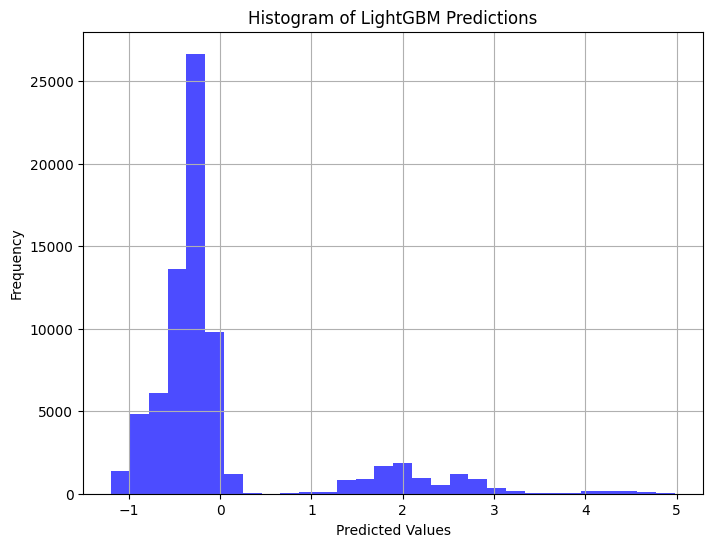

In [9]:
import matplotlib.pyplot as plt


# Now plot the histogram of predictions on the validation set
y_val_pred = best_model.predict(X_val, num_iteration=best_model.best_iteration_)

# Plot the histogram
plt.figure(figsize=(8, 6))
plt.hist(y_val_pred, bins=30, color='blue', alpha=0.7)
plt.title("Histogram of LightGBM Predictions")
plt.xlabel("Predicted Values")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

In [13]:
from sklearn.metrics import mean_squared_error
import numpy as np

# Assuming best_model has been trained and X_val is your validation data

# Generate predictions using the trained model
preds_val = best_model.predict(X_val)

# Ensure that y_val and preds_val have the same shape
print(f'y_val shape: {y_val.shape}, preds_val shape: {preds_val.shape}')

# Adjust the shapes if necessary (if the lengths do not match)
if len(preds_val) > len(y_val):
    preds_val = preds_val[:len(y_val)]  # Ensure predictions are the same length as true values

# Denormalize both the actual and predicted values
y_val_denormalized = y_val * std + mean
preds_val_denormalized = preds_val * std + mean

# Define a function to compute RMSE
def root_mean_squared_error(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

# Compute the RMSE
rmse = root_mean_squared_error(y_val_denormalized, preds_val_denormalized)

# Print the RMSE
print('Model validation RMSE: {:.4f}'.format(rmse))


y_val shape: (73803,), preds_val shape: (73803,)
Model validation RMSE: 3426.2651


## SUBMISION

In [14]:
import numpy as np

# Function to extend the label encoder with new unseen labels
def extend_label_encoder(encoder, new_labels):
    """Extend the LabelEncoder to handle new labels in the test set."""
    current_classes = list(encoder.classes_)
    
    # Convert all current and new classes to strings to avoid comparison issues
    current_classes = [str(cls) for cls in current_classes]
    new_labels = [str(lbl) for lbl in new_labels]
    
    for label in new_labels:
        if label not in current_classes:
            current_classes.append(label)
    
    # Keep classes sorted, now everything is a string
    encoder.classes_ = np.array(sorted(current_classes))

# Loop through the categorical columns and extend the label encoders with unseen labels
for col in categorical_columns:
    if col in label_encoders:
        unseen_labels = set(X[col].unique()) - set(label_encoders[col].classes_)
        if unseen_labels:
            extend_label_encoder(label_encoders[col], unseen_labels)
        
        # Cast the column to string before transforming to avoid dtype issues
        X[col] = label_encoders[col].transform(X[col].astype(str))

# Predict on the encoded test set
y_pred = best_model.predict(X)

# Denormalize the predictions
y_test_denormalized = y_pred * std + mean

# Print the denormalized predictions
print("Denormalized Predictions (y_test):")
print(y_test_denormalized)


Denormalized Predictions (y_test):
[ 53522.51511503 210098.55541754 174028.47619369 ...  55242.87788559
  73575.67996577 207013.25855952]


In [16]:

import pandas as pd

# Assuming 'y_test_denormalized' contains the predictions and 'submission_set.csv' has the 'flight_id' column

# Load the test data to extract 'flight_id'
dft0 = pd.read_csv('submission_set.csv')

print("Shape of y_test_denormalized:", y_test_denormalized.shape)
print("Shape of dft0:", dft0.shape)

y_test_denormalized = y_test_denormalized[:dft0.shape[0]]


Shape of y_test_denormalized: (369013,)
Shape of dft0: (105959, 18)


In [17]:
import pandas as pd

# Assuming 'y_test_denormalized' contains the predictions and 'submission_set.csv' has the 'flight_id' column

# Load the test data to extract 'flight_id'
dft0 = pd.read_csv('submission_set.csv')

# Assign the denormalized predictions to the 'tow' column
dft0['tow'] = y_test_denormalized

# Save the flight_id and tow columns to a CSV file
dft0[['flight_id', 'tow']].to_csv('lightgbm.csv', index=False)

# Print a confirmation message
print("Predictions saved to 'lightgbm.csv'.")


Predictions saved to 'lightgbm.csv'.


In [18]:
!head lightgbm.csv

flight_id,tow
248753821,53522.51511502742
248753822,210098.55541754427
248754498,174028.47619369059
248757623,190211.16656543547
248763603,66741.55653798487
248755068,63632.2265795933
248754229,51714.64964880208
248754894,88231.63313046048
248754751,188755.59171399317
